## pip install

In [1]:
pip install binclass_tools

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install scikit-plot

Note: you may need to restart the kernel to use updated packages.


## 1. Imports

In [1]:
import pandas as pd
import datetime
from dateutil import parser
import numpy as np
import matplotlib.pyplot as plt


In [2]:
import seaborn as sns

In [3]:
########################Import ML model libraries ###################
from collections import Counter
from sklearn.datasets import make_classification
from sklearn import *
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
import xgboost as xgb
import multiprocessing
multiprocessing.cpu_count()

12

In [4]:
import warnings
warnings.filterwarnings('ignore')

## 2. Load data

In [5]:
#########Read in time varying opportunities file,weekly snapshot for each opportunity. Refer data_pull.ipnyb for the data pull SQL query ################
##########Each opportunity is already sorted in ascending order of date#################################
df = pd.read_csv('./raw_opportunities_data.csv',low_memory = False)
df.columns = df.columns.str.lower()
df.snapshot_calendar_date = pd.to_datetime(df.snapshot_calendar_date)

In [6]:
df.head(2)

,opportunity_id,opportunity_name,opportunity_reason_lost,amtss_annualized_contract_value,amtss_total_contract_value,amtss_product_acv,amtss_services_acv,amtss_product_tcv,amtss_services_tcv,opportunity_product_entity,...,customer_id,customer_name,customer_industry,customer_cisco_sl1,customer_cisco_sl2,customer_cisco_scms,customer_cisco_sub_scms,msp_flag,record_inserted_date,rank
0,0061T00000sYJHZQA4,AE - (Epiroc AB) - (Umbrela SIG-E) - (14K Users),No Timeline,263020.33,789061.0,228713.333333,34307.0,686140.0,102921.0,Umbrella,...,0011T00002TsTAeQAN,EPIROC SWEDEN AB,Manufacturing: Other,EMEAR-REGION,EMEAR-NORTH,Commercial,Com-Select,False,2022-11-13,1.0
1,0061T00000sYJHZQA4,AE - (Epiroc AB) - (Umbrela SIG-E) - (14K Users),No Timeline,263020.33,789061.0,228713.333333,34307.0,686140.0,102921.0,Umbrella,...,0011T00002TsTAeQAN,EPIROC SWEDEN AB,Manufacturing: Other,EMEAR-REGION,EMEAR-NORTH,Commercial,Com-Select,False,2022-11-13,1.0


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 830444 entries, 0 to 830443
Columns: 112 entries, opportunity_id to rank
dtypes: bool(3), datetime64[ns](1), float64(24), int64(16), object(68)
memory usage: 693.0+ MB


In [8]:
df.describe()

,amtss_annualized_contract_value,amtss_total_contract_value,amtss_product_acv,amtss_services_acv,amtss_product_tcv,amtss_services_tcv,opportunity_stage_sort_order,opportunity_close_cisco_fiscal_year,opportunity_close_cisco_fiscal_quarter_cur_seq,opportunity_close_cisco_fiscal_week_of_quarter,...,teleprospecting_qualified_fiscal_quarter_cur_seq,teleprospecting_qualified_fiscal_quarter_seq_number,opportunity_created_fiscal_quarter_cur_seq.1,opportunity_created_fiscal_quarter_seq_number,sales_qualified_fiscal_quarter_cur_seq,sales_qualified_fiscal_quarter_seq_number,opportunity_close_fiscal_quarter_cur_seq,opportunity_close_fiscal_quarter_seq_number,amt_annualized_contract_value,rank
count,8.304440e+05,8.302160e+05,8.284010e+05,8.284010e+05,8.284010e+05,8.284010e+05,829769.000000,830444.000000,830444.000000,830444.000000,...,189575.000000,189575.000000,195345.000000,195345.000000,195345.000000,195345.000000,195345.000000,195345.000000,1.953450e+05,195345.0
mean,5.015813e+04,9.840724e+04,5.948970e+04,4.251626e+03,1.054592e+05,8.420610e+03,10.154983,2021.929180,-3.684344,7.697946,...,-27.582155,465.417845,-5.568620,487.431380,-7.893721,485.106279,-3.107313,489.892687,4.368433e+04,1.0
std,2.156505e+05,6.538595e+05,1.946540e+06,2.656612e+04,2.836148e+06,7.928391e+04,4.173910,0.595614,1.967617,3.873649,...,101.250129,101.250129,2.672438,2.672438,34.280768,34.280768,1.726698,1.726698,1.885539e+05,0.0
min,-5.586016e+05,-5.586016e+05,-5.382888e+05,-4.897703e+05,-5.382888e+05,-4.897703e+05,1.000000,2017.000000,-22.000000,1.000000,...,-493.000000,0.000000,-25.000000,468.000000,-493.000000,0.000000,-8.000000,485.000000,1.000000e+00,1.0
25%,2.754720e+03,3.396400e+03,2.477000e+03,0.000000e+00,2.803200e+03,0.000000e+00,5.000000,2022.000000,-5.000000,5.000000,...,-7.000000,486.000000,-7.000000,486.000000,-7.000000,486.000000,-5.000000,488.000000,2.780580e+03,1.0
50%,1.073290e+04,1.477980e+04,9.772000e+03,6.360000e+02,1.312416e+04,7.714000e+02,13.000000,2022.000000,-4.000000,8.000000,...,-5.000000,488.000000,-5.000000,488.000000,-5.000000,488.000000,-3.000000,490.000000,8.896000e+03,1.0
75%,3.464830e+04,5.357340e+04,3.156800e+04,2.520000e+03,4.841940e+04,3.640000e+03,14.000000,2022.000000,-2.000000,12.000000,...,-4.000000,489.000000,-4.000000,489.000000,-4.000000,489.000000,-2.000000,491.000000,2.898920e+04,1.0
max,2.619766e+07,4.589966e+07,4.500000e+08,2.734326e+06,1.350000e+09,5.986912e+06,14.000000,2028.000000,19.000000,14.000000,...,0.000000,493.000000,0.000000,493.000000,0.000000,493.000000,4.000000,497.000000,5.000000e+06,1.0


## 3.EDA & Feature Engineering

### 3.1 Data Cleaning - Remove Redundant

**Exclude entire time series of 'Rejected' Opportunities**


In [11]:
invalid_opportunities = df.opportunity_id[df.opportunity_stage_name.astype(str) == 'Rejected'].unique()
df = df[~df.opportunity_id.isin(invalid_opportunities)]

**For each opportunity, discard redundant records that occur even after opportunity is Won\Lost**
Use opportunity_stage_name to determine if an opportunity is Won or Lost

In [12]:
close_snapshot_date = df.groupby('opportunity_id',as_index = False).apply(lambda x: pd.DataFrame({'opportunity_id':x.opportunity_id.unique(),'close_date':x.snapshot_calendar_date[(x.opportunity_stage_name == '7-Closed Won') | (x.opportunity_stage_name == 'Closed/Lost')].head(1) if (len(x.snapshot_calendar_date[(x.opportunity_stage_name == '7-Closed Won') | (x.opportunity_stage_name == 'Closed/Lost')].head(1)) > 0) else None}))


df = pd.merge(df,close_snapshot_date,on = 'opportunity_id',how = 'left')
df1 = df[pd.isna(df.close_date)]
df2 = df[~pd.isna(df.close_date)]

df2 = df2[(df2.snapshot_calendar_date <= df2.close_date)]
df1.drop('close_date',axis = 1,inplace=True)
df2.drop('close_date',axis = 1,inplace=True)

df = pd.concat([df2,df1],axis = 0)
df1 = None
df2 = None
close_snapshot_date = None

new_df = df.sort_values(['opportunity_id','snapshot_calendar_date'])

### 3.2 Next steps

**Correct opportunity_status field, where 'Open' statuses are incorrectly marked as Won/Lost**

In [15]:
new_df.opportunity_status[~(new_df.opportunity_stage_name.isin(['7-Closed Won','Closed/Lost']))] = 'Open'

**Remove opportunities that start as 'Won\Lost' for the first snapshot calendar date in the dataset**

In [16]:
tp = new_df.groupby('opportunity_id').apply(lambda x: pd.DataFrame({'opportunity_id':x.opportunity_id,'len':len(x.opportunity_id[(x.opportunity_status == 'Won') | (x.opportunity_status == 'Lost')])}))
tp = tp[tp.len > 1]
new_df = new_df[~(new_df.opportunity_id.isin(tp.opportunity_id))]

**Exclude opportunities that were Won and had a negative ACV at the time it was Won**

In [17]:
new_df = new_df[~new_df.opportunity_id.isin(new_df.opportunity_id[(new_df.opportunity_status == 'Won') & (new_df.amtss_annualized_contract_value <= 0)])]


**For each opportunity and for each snapshot of the opportunity,calculate precentage acv change from the first occurence of a positive value**

In [18]:
first_positive_acv = pd.DataFrame(new_df[new_df.amtss_annualized_contract_value > 0].groupby('opportunity_id',as_index = False)['amtss_annualized_contract_value'].first())
new_df = new_df.merge(first_positive_acv,how = 'left',on = 'opportunity_id')
new_df['acv_dollar_change'] = (new_df.amtss_annualized_contract_value_x - new_df.amtss_annualized_contract_value_y)
new_df['acv_pct_change'] = (new_df.amtss_annualized_contract_value_x - new_df.amtss_annualized_contract_value_y)/new_df.amtss_annualized_contract_value_y

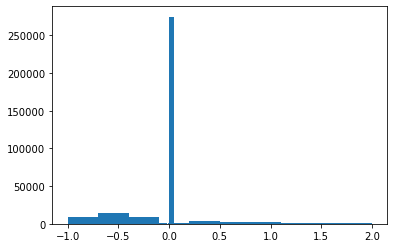

In [19]:
count, division = np.histogram(new_df.acv_pct_change[(new_df.amtss_annualized_contract_value_x > 0)],bins = [-1.0,-0.7,-0.4,-0.1,-0.075,-0.025,-0.0125,0,0.05,0.1,0.15,0.2,0.5,0.8,1.1,1.4,1.7,2])
subset_df = new_df[(new_df.amtss_annualized_contract_value_x > 0)]
subset_df['pct_acv_cuts'] = pd.cut(subset_df['acv_pct_change'], bins=division)
acv_pct_df = pd.DataFrame(subset_df.groupby('pct_acv_cuts').apply(lambda x: len(x.opportunity_id[x.opportunity_status == 'Won'])/len(x.opportunity_id[(x.opportunity_status == 'Won') | (x.opportunity_status == 'Lost')])))
counts = pd.DataFrame(subset_df.groupby('pct_acv_cuts').apply(lambda x: len(x.opportunity_id[(x.opportunity_status == 'Won') | (x.opportunity_status == 'Lost')])))
acv_pct_df = acv_pct_df.merge(counts,how = 'inner',left_index = True,right_index = True)
acv_pct_df.columns = ['pct_opportunities_won','Num_Opportunities_Won_or_Lost']
acv_pct_df.to_csv("acv_pct_df.csv")
plt.hist(new_df.acv_pct_change[(new_df.amtss_annualized_contract_value_x > 0)],bins = [-1.0,-0.7,-0.4,-0.1,-0.075,-0.025,-0.0125,0,0.05,0.1,0.15,0.2,0.5,0.8,1.1,1.4,1.7,2])
count, division = np.histogram(new_df.acv_pct_change[(new_df.amtss_annualized_contract_value_x > 0)],bins = [-1.0,-0.7,-0.4,-0.1,-0.075,-0.025,-0.0125,0,0.05,0.1,0.15,0.2,0.5,0.8,1.1,1.4,1.7,2])
subset_df = new_df[(new_df.amtss_annualized_contract_value_x > 0)]


**Calculate number of times ACV changed for each opportunity**

In [20]:
num_times_acv_change = new_df[new_df.amtss_annualized_contract_value_x > 0].groupby('opportunity_id').apply(lambda x:pd.DataFrame({'opportunity_id':x.opportunity_id,'snapshot_calendar_date':x.snapshot_calendar_date,'amtss_annualized_contract_value_x':x.amtss_annualized_contract_value_x.diff()}))
num_times_acv_change.columns = ['opportunity_id','snapshot_calendar_date','amtss_annualized_contract_value_diff']
num_times_acv_change['acv_increase_flag'] = ((num_times_acv_change.amtss_annualized_contract_value_diff > 0) & (~(np.isnan(num_times_acv_change.amtss_annualized_contract_value_diff))))
num_times_acv_change['acv_decrease_flag'] = ((num_times_acv_change.amtss_annualized_contract_value_diff < 0) & (~(np.isnan(num_times_acv_change.amtss_annualized_contract_value_diff))))
num_times_acv_change['acv_change_flag'] = ((num_times_acv_change['acv_increase_flag']) | (num_times_acv_change['acv_decrease_flag']))
num_times_acv_change = num_times_acv_change.groupby('opportunity_id').apply(lambda x: pd.DataFrame({'opportunity_id':x.opportunity_id,'snapshot_calendar_date':x.snapshot_calendar_date,'amtss_annualized_contract_value_diff':x.amtss_annualized_contract_value_diff,'num_times_acv_change':np.cumsum(x.acv_change_flag),'num_times_acv_increase':np.cumsum(x.acv_increase_flag),'num_times_acv_decrease':np.cumsum(x.acv_decrease_flag)}))

subset_df_1 = new_df[new_df.amtss_annualized_contract_value_x > 0]
subset_df_2 = new_df[new_df.amtss_annualized_contract_value_x <= 0]
subset_df_1 = pd.merge(subset_df_1,num_times_acv_change,how = 'left',on = ['opportunity_id','snapshot_calendar_date']) 

subset_df_2['amtss_annualized_contract_value_diff'] = np.nan
subset_df_2['num_times_acv_change'] = np.nan
subset_df_2['num_times_acv_increase'] = np.nan
subset_df_2['num_times_acv_decrease'] = np.nan

new_df = subset_df_1.append(subset_df_2)
new_df = new_df.sort_values(['opportunity_id','snapshot_calendar_date'])

In [21]:
subset_df = new_df[(new_df.amtss_annualized_contract_value_x > 0) & ((new_df.opportunity_status == 'Won') | (new_df.opportunity_status == 'Lost'))]

In [23]:
count_change, division_change = np.histogram(subset_df.num_times_acv_change)
count_increase, division_increase = np.histogram(subset_df.num_times_acv_increase)
count_decrease, division_decrease = np.histogram(subset_df.num_times_acv_decrease)

subset_df['bins_change'] = pd.cut(subset_df.num_times_acv_change,bins = division_change)
subset_df['bins_increase'] = pd.cut(subset_df.num_times_acv_increase,bins = division_increase)
subset_df['bins_decrease'] = pd.cut(subset_df.num_times_acv_decrease,bins = division_decrease)

change_df = subset_df.groupby('bins_change').apply(lambda x: pd.DataFrame({'Won':len(x[x.opportunity_status == 'Won']),'Lost':len(x[x.opportunity_status == 'Lost']),'Total':len(x)},index = [0]))
change_df.to_csv('change_df.csv')
increase_df = subset_df.groupby('bins_increase').apply(lambda x: pd.DataFrame({'Won':len(x[x.opportunity_status == 'Won']),'Lost':len(x[x.opportunity_status == 'Lost']),'Total':len(x)},index = [0]))
increase_df.to_csv('increase_df.csv')
decrease_df = subset_df.groupby('bins_decrease').apply(lambda x: pd.DataFrame({'Won':len(x[x.opportunity_status == 'Won']),'Lost':len(x[x.opportunity_status == 'Lost']),'Total':len(x)},index = [0]))
decrease_df.to_csv('decrease_df.csv')

In [24]:
######################Date format conversions#######################
new_df['snapshot_calendar_date'] = pd.to_datetime(new_df['snapshot_calendar_date'])
new_df['opportunity_created_calendar_date'] = pd.to_datetime(new_df['opportunity_created_calendar_date'])
new_df['Age'] = (new_df['snapshot_calendar_date'] - new_df['opportunity_created_calendar_date']).dt.days

**EDA, quarterly view, observation of opportunities that were open at the beginning of the quarter, broken out by opportunity stage**

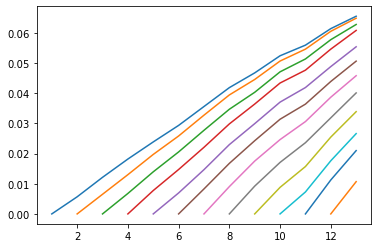

In [26]:
Q4_2021 = new_df[new_df.snapshot_fiscal_year_quarter == '2022/Q4']
grouped = Q4_2021.groupby('snapshot_fiscal_week_of_quarter')
cumulative_df = pd.DataFrame({'cumulative_won':[],'total_beg_opportunities':[]})
for k,v in grouped:
    open_opportunities_ts = Q4_2021[Q4_2021.opportunity_id.isin(v.opportunity_id[v.opportunity_status == 'Open']) & (Q4_2021.snapshot_fiscal_week_of_quarter >= k)]
    won_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x[x.opportunity_status == 'Won'])))
    lost_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x.opportunity_id[x.opportunity_status == 'Lost'])))
    open_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x.opportunity_id[x.opportunity_status == 'Open'])))
    plt.plot(won_opp.cumsum()/len(v.opportunity_id[v.opportunity_status == 'Open']))
    

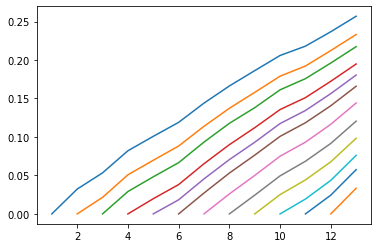

In [27]:
###############EDA, quarterly view, observation of opportunities that were open at the beginning of the quarter, broken out by opportunity stage
for k,v in grouped:
    open_opportunities_ts = Q4_2021[Q4_2021.opportunity_id.isin(v.opportunity_id[v.opportunity_status == 'Open']) & (Q4_2021.snapshot_fiscal_week_of_quarter >= k)]
    won_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x[x.opportunity_status == 'Won'])))
    lost_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x.opportunity_id[x.opportunity_status == 'Lost'])))
    open_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x.opportunity_id[x.opportunity_status == 'Open'])))
    plt.plot(lost_opp.cumsum()/len(v.opportunity_id[v.opportunity_status == 'Open']))


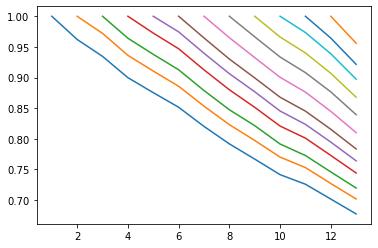

In [28]:
###############EDA, quarterly view, observation of opportunities that were open at the beginning of the quarter, broken out by opportunity stage
for k,v in grouped:
    open_opportunities_ts = Q4_2021[Q4_2021.opportunity_id.isin(v.opportunity_id[v.opportunity_status == 'Open']) & (Q4_2021.snapshot_fiscal_week_of_quarter >= k)]
    won_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x[x.opportunity_status == 'Won'])))
    lost_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x.opportunity_id[x.opportunity_status == 'Lost'])))
    open_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x.opportunity_id[x.opportunity_status == 'Open'])))
    plt.plot(open_opp/len(v.opportunity_id[v.opportunity_status == 'Open']))

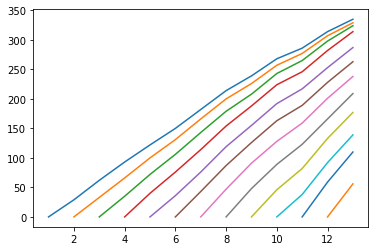

In [29]:
###############EDA, quarterly view, observation of opportunities that were open at the beginning of the quarter, broken out by opportunity stage
for k,v in grouped:
    open_opportunities_ts = Q4_2021[Q4_2021.opportunity_id.isin(v.opportunity_id[v.opportunity_status == 'Open']) & (Q4_2021.snapshot_fiscal_week_of_quarter >= k)]
    won_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x[x.opportunity_status == 'Won'])))
    lost_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x.opportunity_id[x.opportunity_status == 'Lost'])))
    open_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x.opportunity_id[x.opportunity_status == 'Open'])))
    plt.plot(won_opp.cumsum())


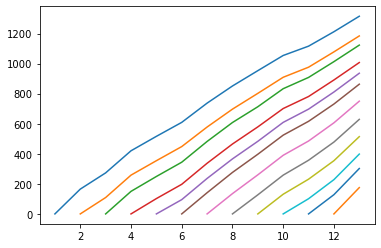

In [30]:
###############EDA, quarterly view, observation of opportunities that were open at the beginning of the quarter, broken out by opportunity stage
for k,v in grouped:
    open_opportunities_ts = Q4_2021[Q4_2021.opportunity_id.isin(v.opportunity_id[v.opportunity_status == 'Open']) & (Q4_2021.snapshot_fiscal_week_of_quarter >= k)]
    won_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x[x.opportunity_status == 'Won'])))
    lost_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x.opportunity_id[x.opportunity_status == 'Lost'])))
    open_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x.opportunity_id[x.opportunity_status == 'Open'])))
    plt.plot(lost_opp.cumsum())

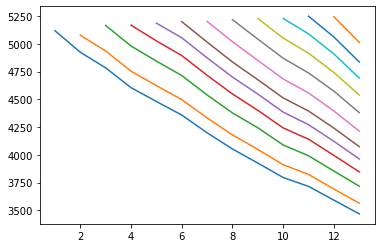

In [31]:
###############EDA, quarterly view, observation of opportunities that were open at the beginning of the quarter, broken out by opportunity stage
for k,v in grouped:
    open_opportunities_ts = Q4_2021[Q4_2021.opportunity_id.isin(v.opportunity_id[v.opportunity_status == 'Open']) & (Q4_2021.snapshot_fiscal_week_of_quarter >= k)]
    won_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x[x.opportunity_status == 'Won'])))
    lost_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x.opportunity_id[x.opportunity_status == 'Lost'])))
    open_opp = pd.DataFrame(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter').apply(lambda x: len(x.opportunity_id[x.opportunity_status == 'Open'])))
    plt.plot(open_opp)

In [32]:
###############EDA, quarterly view, observation of opportunities that were open at the beginning of the quarter, broken out by forecast category
grouped = Q4_2021.groupby(['snapshot_fiscal_week_of_quarter','forecast_category_name'])
won_df = pd.DataFrame()
lost_df = pd.DataFrame()
open_df = pd.DataFrame()
for k,v in grouped:
    #ax = plt.subplot(3, 2, k[0]+1)
    open_opportunities_ts = Q4_2021[Q4_2021.opportunity_id.isin(v.opportunity_id[v.opportunity_status == 'Open']) & (Q4_2021.snapshot_fiscal_week_of_quarter >= k[0])]
    won_opp =pd.DataFrame({'starting_week':np.resize(v.snapshot_fiscal_week_of_quarter.unique(),len(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter')['opportunity_status'].apply(lambda x: len(x[x == 'Won'])))),
                           'num_opportunities_starting':np.resize(len(v.opportunity_id[v.opportunity_status == 'Open']),len(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter')['opportunity_status'].apply(lambda x: len(x[x == 'Won'])))),
                           'forecast_category_name':np.resize(v.forecast_category_name.unique(),len(open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter')['opportunity_status'].apply(lambda x: len(x[x == 'Won'])))),
                           'num_opportunities':open_opportunities_ts.groupby('snapshot_fiscal_week_of_quarter')['opportunity_status'].apply(lambda x: len(x[x == 'Won']))})
    won_opp['observation_week'] = np.arange(k[0],k[0]+len(won_opp),1)
    won_df = won_df.append(pd.DataFrame({'starting_week':won_opp.starting_week,'observation_week':won_opp.observation_week,'num_opportunities_starting':won_opp.num_opportunities_starting,'forecast_category_name':won_opp.forecast_category_name,'cumul_num_opportunities':won_opp.num_opportunities.cumsum()}))

won_df['cumul_prob_win'] = won_df['cumul_num_opportunities']/won_df['num_opportunities_starting']
won_df.to_csv("won_df_by_forecast_category_name.csv",index=False)


**Read in additional information about leads and merge with opportunities data frame.** Refer data_pull.ipnyb for the SQL

In [33]:
########Read in additional information about leads and merge with opportunities data frame. Refer data_pull.ipnyb for the SQL ############
sl_df = pd.read_csv("sl1_sl2_table.csv",low_memory = False)
sl_df.columns = sl_df.columns.str.lower()
sl_df = sl_df[['opportunity_id','amt_annualized_contract_value','opportunity_type_id','opportunity_type_name','customer_type','customer_subtype','customer_sl1','customer_sl2','customer_sl3','customer_sl4','customer_sl5','customer_sl6','bizible_source_rollup','opportunity_ela_flag','sales_qualified_date',
       'sales_qualified_fiscal_year_quarter', 'sales_qualified_fiscal_year',
       'sales_qualified_fiscal_quarter_cur_seq',
       'sales_qualified_fiscal_quarter_cur_seq_name',
       'sales_qualified_fiscal_day_of_quarter',
       'sales_qualified_fiscal_day_of_quarter_cur_seq',
       'sales_qualified_fiscal_last_day_of_fiscal_quarter']]
sl_df = sl_df.groupby('opportunity_id').apply(lambda x:pd.DataFrame(x[x.amt_annualized_contract_value == max(x.amt_annualized_contract_value)]))
sl_df.drop_duplicates(subset = 'opportunity_id',inplace = True)
sl_df = sl_df.reset_index(drop = True)
df = pd.merge(new_df,sl_df,how = 'left',on = 'opportunity_id')
df.opportunity_type_name_y[df.opportunity_type_name_y.isin(['MSP New Customer'])] = 'New Customer'
df.opportunity_type_name_y[df.opportunity_type_name_y.isin(['MSP Upsell'])] = 'Upsell into existing customer'
df = df[~df.opportunity_id.isin(df.opportunity_id[df.customer_type == 'Service Provider'])]
df.customer_subtype[~df.customer_subtype.isin(['DVAR - Cisco','Direct - Cisco'])] = 'Other'
df['sales_qualified_date_y'] = pd.to_datetime(df['sales_qualified_date_y'])
df.snapshot_calendar_date = pd.to_datetime(df.snapshot_calendar_date)
df.sales_qualified_date_y = pd.to_datetime(df.sales_qualified_date_y)
df['age_by_sql'] = (df.snapshot_calendar_date - df.sales_qualified_date_y).dt.days


In [34]:
df.to_csv("latest_df.csv",index=False)

In [35]:
#EDA
subset_df = df[((df.opportunity_status == 'Won') | (df.opportunity_status == 'Lost'))]
subset_df.groupby('opportunity_type_name_y').apply(lambda x: pd.DataFrame({'Won':len(x[x.opportunity_status == 'Won']),'Lost':len(x[x.opportunity_status == 'Lost']),'Total':len(x)},index = [0]))
subset_df.groupby('customer_type').apply(lambda x: pd.DataFrame({'Won':len(x[x.opportunity_status == 'Won']),'Lost':len(x[x.opportunity_status == 'Lost']),'Total':len(x)},index = [0]))
subset_df.groupby('customer_subtype').apply(lambda x: pd.DataFrame({'Won':len(x[x.opportunity_status == 'Won']),'Lost':len(x[x.opportunity_status == 'Lost']),'Total':len(x)},index = [0]))
subset_df.groupby('customer_sl2').apply(lambda x: pd.DataFrame({'Won':len(x[x.opportunity_status == 'Won']),'Lost':len(x[x.opportunity_status == 'Lost']),'Total':len(x)},index = [0])).to_csv('by_sl2.csv')
subset_df.groupby('customer_sl3').apply(lambda x: pd.DataFrame({'Won':len(x[x.opportunity_status == 'Won']),'Lost':len(x[x.opportunity_status == 'Lost']),'Total':len(x)},index = [0]))
subset_df = df[((df.opportunity_status == 'Won') | (df.opportunity_status == 'Lost')) & df.age_by_sql > 0]
subset_df['bins_age_by_sql'] = pd.cut(subset_df['age_by_sql'],bins = [0,14,28,60,120,  240,553])
subset_df.groupby('bins_age_by_sql').apply(lambda x: pd.DataFrame({'Won':len(x[x.opportunity_status == 'Won']),'Lost':len(x[x.opportunity_status == 'Lost']),'Total':len(x)},index = [0])).to_csv('by_age_by_sql.csv')
subset_df.groupby('bizible_source_rollup').apply(lambda x: pd.DataFrame({'Won':len(x[x.opportunity_status == 'Won']),'Lost':len(x[x.opportunity_status == 'Lost']),'Total':len(x)},index = [0])).to_csv('by_bizible_source_rollup.csv')
subset_df.groupby('opportunity_ela_flag').apply(lambda x: pd.DataFrame({'Won':len(x[x.opportunity_status == 'Won']),'Lost':len(x[x.opportunity_status == 'Lost']),'Total':len(x)},index = [0])).to_csv('opportunity_ela_flag.csv')

In [36]:
##########Remove time series of opportunities having acv more than 1 million or less than 0
df = df.rename(columns = {'amtss_annualized_contract_value_x':'amtss_annualized_contract_value'})
df = df.drop(columns = 'amtss_annualized_contract_value_y')
df_model = df[['opportunity_id','snapshot_calendar_date','snapshot_fiscal_year_quarter','snapshot_fiscal_week_of_quarter','snapshot_fiscal_day_of_quarter','snapshot_fiscal_last_day_of_fiscal_quarter','opportunity_created_calendar_date','sales_qualified_date_y','opportunity_stage_name','forecast_category_name','amtss_annualized_contract_value','Age','opportunity_product_sub_entity','opportunity_type_name_y','customer_type','customer_subtype','opportunity_ela_flag','age_by_sql','opportunity_status']]
df_model['log_Age'] = np.log(1+df_model.Age)
df_model = df_model[~(df_model.opportunity_id.isin(df_model.opportunity_id[(df_model.amtss_annualized_contract_value < 0) | (df_model.amtss_annualized_contract_value > 1000000)]))]

In [37]:
#Recalculating percentage change in ACV since first occurence of $1000 instead of > 0#
first_positive_acv = pd.DataFrame(df_model[df_model.amtss_annualized_contract_value > 1000].groupby('opportunity_id',as_index = False)['amtss_annualized_contract_value'].first())
df_model = df_model.merge(first_positive_acv,how = 'left',on = 'opportunity_id')
df_model['acv_dollar_change'] = (df_model.amtss_annualized_contract_value_x - df_model.amtss_annualized_contract_value_y)
df_model['acv_pct_change'] = (df_model.amtss_annualized_contract_value_x - df_model.amtss_annualized_contract_value_y)/df_model.amtss_annualized_contract_value_y
num_times_acv_change = df_model[df_model.amtss_annualized_contract_value_x > 0].groupby('opportunity_id').apply(lambda x:pd.DataFrame({'opportunity_id':x.opportunity_id,'snapshot_calendar_date':x.snapshot_calendar_date,'amtss_annualized_contract_value_x':x.amtss_annualized_contract_value_x.diff()}))
num_times_acv_change.columns = ['opportunity_id','snapshot_calendar_date','amtss_annualized_contract_value_diff']
num_times_acv_change['acv_increase_flag'] = ((num_times_acv_change.amtss_annualized_contract_value_diff > 0) & (~(np.isnan(num_times_acv_change.amtss_annualized_contract_value_diff))))
num_times_acv_change['acv_decrease_flag'] = ((num_times_acv_change.amtss_annualized_contract_value_diff < 0) & (~(np.isnan(num_times_acv_change.amtss_annualized_contract_value_diff))))
num_times_acv_change['acv_change_flag'] = ((num_times_acv_change['acv_increase_flag']) | (num_times_acv_change['acv_decrease_flag']))
num_times_acv_change = num_times_acv_change.groupby('opportunity_id').apply(lambda x: pd.DataFrame({'opportunity_id':x.opportunity_id,'snapshot_calendar_date':x.snapshot_calendar_date,'amtss_annualized_contract_value_diff':x.amtss_annualized_contract_value_diff,'num_times_acv_change':np.cumsum(x.acv_change_flag),'num_times_acv_increase':np.cumsum(x.acv_increase_flag),'num_times_acv_decrease':np.cumsum(x.acv_decrease_flag)}))
subset_df_1 = df_model[df_model.amtss_annualized_contract_value_x > 0]
subset_df_2 = df_model[df_model.amtss_annualized_contract_value_x <= 0]
subset_df_1 = pd.merge(subset_df_1,num_times_acv_change,how = 'left',on = ['opportunity_id','snapshot_calendar_date'])  
subset_df_2['amtss_annualized_contract_value_diff'] = np.nan
subset_df_2['num_times_acv_change'] = np.nan
subset_df_2['num_times_acv_increase'] = np.nan
subset_df_2['num_times_acv_decrease'] = np.nan
df_model = subset_df_1.append(subset_df_2)
df_model = df_model.sort_values(['opportunity_id','snapshot_calendar_date'])

In [38]:
df_model.to_csv('df_model.csv',index=False)

In [39]:
df_model = df_model[(df_model.snapshot_fiscal_year_quarter !='2023/Q2')]

**Restructure data into quarterly and weekly view. For all open opportunities at the beginning of the quarter and the particular week of the quarter** 
observe the behaviour upto the end of the quarter

In [40]:
year_quarter = df_model.snapshot_fiscal_year_quarter.unique()
starting_week = [1,2,3,4,5,6,7,8,9,10,11,12]
#x.iloc[(i-1):i][(x.iloc[(i-1):i]
master_df = pd.DataFrame()

for i in starting_week:
    week_df = pd.DataFrame()
    for j in year_quarter:
        quarterly = df_model[df_model.snapshot_fiscal_year_quarter == j]
        opening_ids = quarterly.groupby('opportunity_id',as_index=False).apply(lambda x: x[(x.snapshot_fiscal_week_of_quarter == i) & (x.opportunity_status == 'Open')])
        won_ids = quarterly[(quarterly.opportunity_status == 'Won') & (quarterly.opportunity_id.isin(opening_ids.opportunity_id)) & (quarterly.snapshot_fiscal_week_of_quarter > i)]
        won_ids = won_ids.opportunity_id.unique()
        lost_ids = quarterly[(quarterly.opportunity_status == 'Lost') & (quarterly.opportunity_id.isin(opening_ids.opportunity_id)) & (quarterly.snapshot_fiscal_week_of_quarter > i)]
        lost_ids = lost_ids.opportunity_id.unique()
        opening_ids['Won'] = opening_ids.opportunity_id.isin(won_ids)
        opening_ids['Lost'] = opening_ids.opportunity_id.isin(lost_ids)
        opening_ids['Class'] = 'Open'
        opening_ids['Class'][opening_ids.Won == True] = 'Won'
        opening_ids['Class'][opening_ids.Lost == True] = 'Lost'
        opening_ids.reset_index(drop=True,inplace=True)
        if (j == '2023/Q1'): opening_ids = pd.concat([opening_ids,pd.DataFrame({'in_sample_flag':np.resize([0],len(opening_ids))})],axis=1)
        else: opening_ids = pd.concat([opening_ids,pd.DataFrame({'in_sample_flag':np.resize([1],len(opening_ids))})],axis=1)
        week_df = week_df.append(opening_ids)
    week_df.reset_index(drop=True,inplace=True)
    week_df = pd.concat([week_df,pd.DataFrame({'starting_week':np.resize(i,len(week_df))})],axis=1)
    master_df = master_df.append(week_df)


In [50]:
master_df.to_csv('master_df.csv',index=False)

**Redevelop model as of 'Q3 2021' and out sample as of 'Q4 2022'**

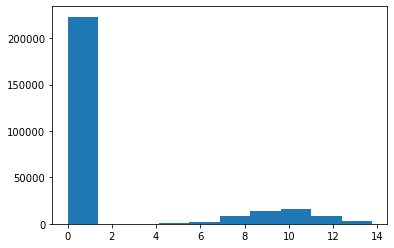

In [46]:
################Variable Transformations###################
master_df = pd.read_csv('master_df.csv',low_memory = False)
master_df.snapshot_fiscal_year_quarter.unique()
master_df.Class[master_df.Class.isin(['Lost','Open'])] =  'NotWon'
master_df['log_abs_acv_change'] = np.log(1+abs(master_df.acv_dollar_change))
plt.hist(master_df.log_abs_acv_change)
master_df[(master_df.starting_week==12)].snapshot_calendar_date.unique()
master_df.drop('amtss_annualized_contract_value_y',axis = 1,inplace=True)
master_df[['snapshot_year', 'snapshot_quarter']] = master_df['snapshot_fiscal_year_quarter'].str.split('/', 1, expand=True)
master_df['snapshot_calendar_date'] = pd.to_datetime(master_df['snapshot_calendar_date'])
master_df['snapshot_month'] = master_df['snapshot_calendar_date'].dt.month
master_df['log_age_by_sql'] = np.log(master_df.age_by_sql + 600)
master_df['log_amtss_annualized_contract_value_x'] = np.log(1+master_df.amtss_annualized_contract_value_x)


In [51]:
###############One Hot Encoding of Categorical Variables #########################33
master_df = pd.concat([master_df,pd.get_dummies(master_df.opportunity_stage_name, prefix='stage')],axis=1)
master_df.drop('opportunity_stage_name',axis=1,inplace=True)
master_df = pd.concat([master_df,pd.get_dummies(master_df.forecast_category_name, prefix='fcname')],axis=1)
master_df.drop('forecast_category_name',axis=1)
master_df = pd.concat([master_df,pd.get_dummies(master_df.opportunity_ela_flag, prefix='oppelaflag')],axis=1)
master_df.drop('opportunity_ela_flag',axis=1,inplace=True)
master_df = pd.concat([master_df,pd.get_dummies(master_df.opportunity_type_name_y, prefix='opptypename')],axis=1)
master_df.drop('opportunity_type_name_y',axis=1,inplace=True)
master_df = pd.concat([master_df,pd.get_dummies(master_df.opportunity_product_sub_entity, prefix='subentity')],axis=1)
master_df.drop('opportunity_product_sub_entity',axis=1,inplace=True)
master_df = pd.concat([master_df,pd.get_dummies(master_df.customer_type, prefix='custtype')],axis=1)
master_df.drop('customer_type',axis=1,inplace=True)
master_df.drop('custtype_Partner',axis=1,inplace=True)
master_df = pd.concat([master_df,pd.get_dummies(master_df.customer_subtype, prefix='custsubtype')],axis=1)
master_df.drop('customer_subtype',axis=1,inplace=True)
master_df = pd.concat([master_df,pd.get_dummies(master_df.snapshot_month, prefix='snapshotmonth')],axis=1)
master_df.drop('snapshot_month',axis=1,inplace=True)
master_df.drop('snapshot_year',axis=1,inplace=True)
master_df.drop('snapshot_quarter',axis=1,inplace=True)
master_df.drop('snapshot_fiscal_week_of_quarter',axis=1,inplace=True)
master_df.drop(['snapshot_fiscal_last_day_of_fiscal_quarter'],axis=1,inplace=True)
master_df = pd.concat([master_df,pd.get_dummies(master_df.starting_week, prefix='startingweek')],axis=1)
master_df.drop('starting_week',axis=1,inplace=True)

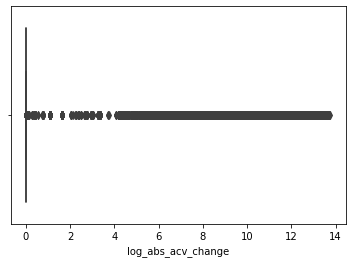

In [52]:
####################Box plot for outlier detection for acv_change variable##################33
import seaborn as sns # # Box plot # sns.boxplot(df.salary) # # Distribution plot # sns.distplot(df.salary)
sns.boxplot(master_df.log_abs_acv_change)
master_df.acv_pct_change[master_df.acv_pct_change > 3] = 3

In [53]:
#################Missing Value Treatment for acv_change variables##################
master_df.num_times_acv_change[np.isnan(master_df.num_times_acv_change)] = 0
master_df.acv_pct_change[np.isnan(master_df.acv_pct_change)] = 0
master_df.log_abs_acv_change[np.isnan(master_df.log_abs_acv_change)] = 0

In [54]:
######################Generate model data frames################################
######################Both X and Y data frames are tagged by the starting week##################
###################Starting week is a categorical variable in the model defining a separate equation for each starting week#########
model_df_X = master_df[['opportunity_id','snapshot_calendar_date','snapshot_fiscal_year_quarter','in_sample_flag','log_amtss_annualized_contract_value_x', 'oppelaflag_False', 'oppelaflag_True',
       'log_Age','acv_pct_change','custtype_Customer','custtype_Ex-Customer',
       'num_times_acv_change',
       'stage_0-Incubate', 'stage_1-Qualify', 'stage_2-Validate',
       'stage_3-Decision', 'stage_4-Negotiate', 'stage_5-Order',
       'stage_5.5-Pending CCW', 'stage_6.5-Pending Provisioning',
       'stage_Accepted', 'stage_Pending Acceptance', 
       'opptypename_New Customer', 'opptypename_Upsell into existing customer',
       'subentity_DNS', 'custsubtype_DVAR - Cisco',
       'custsubtype_Direct - Cisco','snapshotmonth_1',
       'snapshotmonth_2', 'snapshotmonth_3', 'snapshotmonth_4',
       'snapshotmonth_5', 'snapshotmonth_6', 'snapshotmonth_7',
       'snapshotmonth_8', 'snapshotmonth_9', 'snapshotmonth_10',
       'snapshotmonth_11', 'snapshotmonth_12', 'startingweek_1',
       'startingweek_2', 'startingweek_3', 'startingweek_4', 'startingweek_5',
       'startingweek_6', 'startingweek_7', 'startingweek_8', 'startingweek_9',
       'startingweek_10', 'startingweek_11', 'startingweek_12']]
model_df_Y = master_df[['opportunity_id','snapshot_calendar_date','snapshot_fiscal_year_quarter','in_sample_flag', 'startingweek_1',
       'startingweek_2', 'startingweek_3', 'startingweek_4', 'startingweek_5',
       'startingweek_6', 'startingweek_7', 'startingweek_8', 'startingweek_9',
       'startingweek_10', 'startingweek_11', 'startingweek_12','Class']]



In [55]:
########################Divide model data frames into training (insample) and testing (out sample) datasets
in_sample_df_X = model_df_X[(model_df_X.in_sample_flag == 1)]
out_sample_df_X = model_df_X[(model_df_X.in_sample_flag == 0)]
in_sample_df_Y = model_df_Y[(model_df_Y.in_sample_flag == 1)]
out_sample_df_Y = model_df_Y[(model_df_Y.in_sample_flag == 0)]


In [56]:
#############Define Binary Response\Independent Variable
in_sample_df_Y['Class'].replace({"Won":1,"NotWon":0},inplace=True)
out_sample_df_Y['Class'].replace({"Won":1,"NotWon":0},inplace=True)

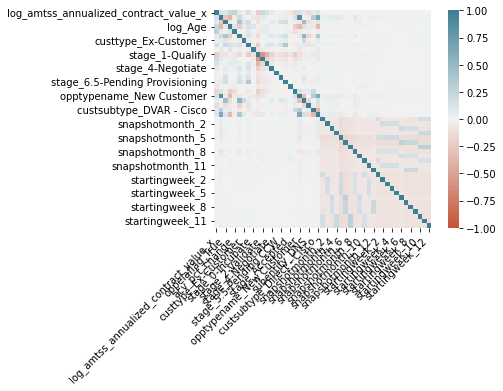

In [57]:
####################Correlation Matrix #################################
corr = in_sample_df_X.drop(['opportunity_id','snapshot_calendar_date','snapshot_fiscal_year_quarter','in_sample_flag'],axis = 1).corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

## 4. Model Building Performance Metrics

### 4.1 Model Building

In [55]:
####################xgb.DMatrix transformation of model data frames for faster computation using sklearn ###############
#d_train = xgb.DMatrix(in_sample_df_X.drop(['opportunity_id','snapshot_calendar_date','snapshot_fiscal_year_quarter','in_sample_flag'],axis=1), in_sample_df_Y.Class)
#d_test = xgb.DMatrix(out_sample_df_X.drop(['opportunity_id','snapshot_calendar_date','snapshot_fiscal_year_quarter','in_sample_flag'],axis=1), out_sample_df_Y.Class)

In [56]:
#################Define xgboost model, using parallel processing on 8 CPUs ###################
#import time
#start_time = time.time()

#params_1 = {
#    'booster': 'gbtree',
#    'eta': 0.01,
#    'objective': 'binary:logistic',
#    'nthread': 8
#    }


#model  = xgb.train(params_1, d_train,num_boost_round = 3000)
#print("--- %s seconds ---" % (time.time() - start_time))

In [58]:
#################Define XGBClassifier model, using parallel processing on 8 CPUs ###################
model = XGBClassifier(eval_metric='logloss',learning_rate = 0.01,n_estimators=3000,nthread=8)

In [59]:
###########################Run model training#######################
import time
start_time = time.time()
model.fit(in_sample_df_X.drop(['opportunity_id','snapshot_calendar_date','snapshot_fiscal_year_quarter','in_sample_flag'],axis=1), in_sample_df_Y.Class)
print("--- %s seconds ---" % (time.time() - start_time))

--- 678.6780171394348 seconds ---


### 4.2 Performance Metrics

In [71]:
##############Extract model feature importance and write to csv ##################################
modelcoeffs = pd.concat([pd.DataFrame(np.array(in_sample_df_X.drop(['opportunity_id','snapshot_calendar_date','snapshot_fiscal_year_quarter','in_sample_flag'],axis=1).columns)),pd.DataFrame(model.feature_importances_)],axis = 1)
modelcoeffs.columns = ['feature','coefficient']
modelcoeffs.to_csv('model_coeffs.csv',index = False)

In [72]:
#########################Run classification predictions on testing dataset ###########################################
predict_df = pd.DataFrame(model.predict(out_sample_df_X.drop(['opportunity_id','snapshot_calendar_date','snapshot_fiscal_year_quarter','in_sample_flag'],axis=1)))
predict_df.reset_index(drop=True,inplace=True)
out_sample_df_X.reset_index(drop=True,inplace=True)
out_sample_df_Y.reset_index(drop=True,inplace=True)
predict_df.columns = ['predicted_Class']
predict_df = pd.concat([out_sample_df_X,out_sample_df_Y.drop(['opportunity_id','snapshot_calendar_date','snapshot_fiscal_year_quarter','in_sample_flag','startingweek_1',
       'startingweek_2', 'startingweek_3', 'startingweek_4', 'startingweek_5',
       'startingweek_6', 'startingweek_7', 'startingweek_8', 'startingweek_9',
       'startingweek_10', 'startingweek_11', 'startingweek_12'],axis = 1),predict_df],axis=1)

In [73]:
##################Print Classification report on testing dataset#######################3
from sklearn.metrics import classification_report
pd.DataFrame(classification_report(predict_df.Class,predict_df.predicted_Class,output_dict=True)).transpose()

,precision,recall,f1-score,support
0,0.977967,0.989187,0.983545,54654.000000
1,0.556972,0.378888,0.450986,1961.000000
accuracy,0.968047,0.968047,0.968047,0.968047
macro avg,0.767469,0.684037,0.717266,56615.000000
weighted avg,0.963385,0.968047,0.965098,56615.000000


In [74]:
#########################Run probability predictions on testing dataset ###########################################
predict_proba = pd.DataFrame(model.predict_proba(out_sample_df_X.drop(['opportunity_id','snapshot_calendar_date','snapshot_fiscal_year_quarter','in_sample_flag'],axis=1)))
predict_proba.columns = ['proba_NotWon', 'proba_Won']
predict_df.reset_index(drop=True)
predict_proba.reset_index(drop=True)
predict_df = pd.concat([predict_df,predict_proba],axis = 1)

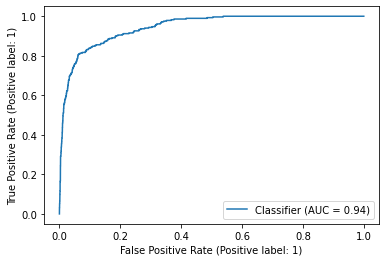

In [75]:
#####################Print Receiver Operating Characteristic (ROC) Curve on testing dataset, for starting week 1 ######################
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
roc_auc_score((predict_df[(predict_df.snapshot_fiscal_year_quarter == '2023/Q1') & (predict_df.startingweek_1 == 1)].Class == 1),predict_df[(predict_df.snapshot_fiscal_year_quarter == '2023/Q1') & (predict_df.startingweek_1 == 1)].proba_Won)
from sklearn.metrics import RocCurveDisplay
RocCurveDisplay.from_predictions((predict_df.Class[(predict_df.snapshot_fiscal_year_quarter == '2023/Q1') & (predict_df.startingweek_1 == 1)] == 1),predict_df[(predict_df.snapshot_fiscal_year_quarter == '2023/Q1') & (predict_df.startingweek_1 == 1)].proba_Won) 

In [76]:
####################Determine optimal probability cutoff threshold for testing dataset, starting week 1#######################
fpr, tpr, thresholds = roc_curve(predict_df.Class[(predict_df.startingweek_1 == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],
                predict_df.proba_Won[(predict_df.startingweek_1 == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],pos_label = 1)

J = tpr - fpr
ix = np.argmax(J)
best_thresh_roc = thresholds[ix]
best_thresh_roc

0.13982747

In [77]:
####################precision recall curve for testing dataset, starting week 1#######################
from sklearn.metrics import precision_recall_curve
precision, recall, thresholds = precision_recall_curve(predict_df.Class[(predict_df.startingweek_1 == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],
                predict_df.proba_Won[(predict_df.startingweek_1 == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],pos_label = 1)
# convert to f score
fscore = (2 * precision * recall) / (precision + recall)
# locate the index of the largest f score
ix = np.argmax(fscore[~np.isnan(fscore)])
best_thresh_precisionrecall = thresholds[ix]
best_thresh_precisionrecall


0.28326446

In [78]:
#########################Get best threshold based on above ###########################333
best_thresh = 0.30840632
predict_df['predicted_Class'] = 0
predict_df.predicted_Class[predict_df.proba_Won >= best_thresh] = 1


In [79]:
############################Confusion Matrix and f1 score on testing dataset for starting week 1 ############################
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import scikitplot as skplt

accuracy_score(predict_df.Class,predict_df.predicted_Class)

#skplt.metrics.plot_cumulative_gain(predict_df.Class[(predict_df.startingweek_1 == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],
#                predict_df.predicted_Class[(predict_df.startingweek_1 == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')])

confusion_matrix(predict_df.Class[(predict_df.startingweek_1 == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],
                predict_df.predicted_Class[(predict_df.startingweek_1 == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')])

pd.DataFrame(confusion_matrix(predict_df.Class[(predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],
                predict_df.predicted_Class[(predict_df.snapshot_fiscal_year_quarter == '2023/Q1')]))

f1_score(predict_df.Class[(predict_df.startingweek_1 == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],
                predict_df.predicted_Class[(predict_df.startingweek_1 == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],
        pos_label = 1)
pd.DataFrame(classification_report(predict_df.Class[(predict_df.startingweek_1 == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],
                predict_df.predicted_Class[(predict_df.startingweek_1 == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],output_dict = True)).transpose()



,precision,recall,f1-score,support
0,0.978422,0.970352,0.974370,4486.000000
1,0.585670,0.661972,0.621488,284.000000
accuracy,0.951992,0.951992,0.951992,0.951992
macro avg,0.782046,0.816162,0.797929,4770.000000
weighted avg,0.955038,0.951992,0.953360,4770.000000


In [80]:
###################Confusion Matrix, f1 score, classification report for all starting weeks #############################
predicted_acv_df = pd.DataFrame()
confusion_df = pd.DataFrame()
classificationreport_df = pd.DataFrame()
threshold_df = pd.DataFrame()
for i in [1,2,3,4,5,6,7,8,9,10,11,12]:
    precision, recall, thresholds = precision_recall_curve(predict_df.Class[(predict_df['startingweek_'+str(i)] == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],
                predict_df.proba_Won[(predict_df['startingweek_'+str(i)] == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],pos_label = 1)
    
    
    fscore = (2 * precision * recall) / (precision + recall)
    
    ix = np.argmax(fscore[~np.isnan(fscore)])
    best_thresh_precisionrecall = thresholds[ix]
    
    fpr, tpr, thresholds = roc_curve(predict_df.Class[(predict_df['startingweek_'+str(i)] == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],
                predict_df.proba_Won[(predict_df['startingweek_'+str(i)] == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],pos_label = 1)

    J = tpr - fpr
    ix = np.argmax(J)
    best_thresh_roc = thresholds[ix]

    
    
    predict_df['predicted_Class'] = 0
    predict_df.predicted_Class[predict_df.proba_Won >= best_thresh_precisionrecall] = 1
    
    opening_acv = sum((np.exp(predict_df.log_amtss_annualized_contract_value_x[(predict_df['startingweek_'+str(i)] == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')]) - 1))
    predicted_acv = sum((np.exp(predict_df.log_amtss_annualized_contract_value_x[(predict_df['startingweek_'+str(i)] == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')]) - 1)*(predict_df.predicted_Class[(predict_df['startingweek_'+str(i)] == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')] == 1))
    actual_acv = sum((np.exp(predict_df.log_amtss_annualized_contract_value_x[(predict_df['startingweek_'+str(i)] == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')]) - 1)*(predict_df.Class[(predict_df['startingweek_'+str(i)] == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')] == 1))
    predicted_acv_df = predicted_acv_df.append(pd.DataFrame({'starting_week':i,'opening_acv':opening_acv,'predicted_acv':predicted_acv,'actual_acv':actual_acv},index=[0]))
    confusionmatrix = pd.DataFrame(confusion_matrix(predict_df.Class[(predict_df['startingweek_'+str(i)] == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],
                predict_df.predicted_Class[(predict_df['startingweek_'+str(i)] == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')]))
    classificationreport = pd.DataFrame(classification_report(predict_df.Class[(predict_df['startingweek_'+str(i)] == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],
                predict_df.predicted_Class[(predict_df['startingweek_'+str(i)] == 1) & (predict_df.snapshot_fiscal_year_quarter == '2023/Q1')],output_dict = True)).transpose()
    
    confusion_df.reset_index(drop = True,inplace = True)
    classificationreport_df.reset_index(drop = True,inplace = True)
    confusionmatrix.reset_index(drop = True,inplace = True)
    classificationreport.reset_index(drop = True,inplace = True)
    
    threshold_df = threshold_df.append(pd.DataFrame({'starting_week':i,'best_thresh_precisionrecall':best_thresh_precisionrecall,'best_thresh_roc':best_thresh_roc},index = [0]))
    
    confusion_df = confusion_df.append(pd.concat([pd.DataFrame({'starting_week':np.resize(i,len(confusionmatrix))}),confusionmatrix],axis=1))
    classificationreport_df = classificationreport_df.append(pd.concat([pd.DataFrame({'starting_week':np.resize(i,len(classificationreport))}),classificationreport],axis=1))
predicted_acv_df.to_csv("predicted_acv_varying_threshold.csv",index=False)
confusion_df.to_csv('confusion_df_varying_threshold.csv',index=False)
classificationreport_df.to_csv('classificationreport_df_varying_threshold.csv',index= False)
threshold_df.to_csv('threshold_df.csv',index=False)

In [81]:
#import binclass_tools as bc
import bctools as bc

In [82]:
len(np.array(in_sample_df_Y[in_sample_df_Y.startingweek_3 == 1].Class))

21238

### 4.3 Interactive Confusion Matrix

#### 4.3.1 Interactive Confusion Matrix for Insample Data

In [85]:
for i in range(1,7):
    train_predicted_proba = model.predict_proba(in_sample_df_X[in_sample_df_X["startingweek_"+str(i)] == 1].drop(['opportunity_id','snapshot_calendar_date','snapshot_fiscal_year_quarter','in_sample_flag'],axis=1))
    currency = '$' 
    amounts = (np.array(np.exp(in_sample_df_X[in_sample_df_X["startingweek_"+str(i)] == 1].log_amtss_annualized_contract_value_x) - 1))

    cf_fig, var_metrics_df, invar_metrics_df, opt_thresh_df = bc.confusion_matrix_plot(
        true_y = np.array(in_sample_df_Y[in_sample_df_Y["startingweek_"+str(i)] == 1].Class),
        predicted_proba = np.array(train_predicted_proba[:,1]),
        amounts = amounts,
        currency=currency,
        title = 'Interactive Confusion Matrix for the Week:-'+str(i))
    cf_fig.show()

#### 4.3.2 Interactive Confusion Matrix for Outsample Data

In [86]:
for i in range(1,7):
    train_predicted_proba = model.predict_proba(out_sample_df_X[out_sample_df_X["startingweek_"+str(i)] == 1].drop(['opportunity_id','snapshot_calendar_date','snapshot_fiscal_year_quarter','in_sample_flag'],axis=1))
    amounts = np.array(np.exp(out_sample_df_X[out_sample_df_X["startingweek_"+str(i)] == 1].log_amtss_annualized_contract_value_x) - 1)
    test_cost_dict = bc.get_cost_dict(TN = 0, FP = np.array((np.exp(out_sample_df_X[out_sample_df_X["startingweek_"+str(i)] == 1].log_amtss_annualized_contract_value_x) - 1)), FN = -np.array((np.exp(out_sample_df_X[out_sample_df_X["startingweek_"+str(i)] == 1].log_amtss_annualized_contract_value_x) - 1)), TP = 0)
    currency = '$'

    cf_fig, var_metrics_df, invar_metrics_df, opt_thresh_df = bc.confusion_matrix_plot(
        true_y = np.array(out_sample_df_Y[out_sample_df_Y["startingweek_"+str(i)] == 1].Class),
        predicted_proba = np.array(train_predicted_proba[:,1]),
        amounts = amounts,
        #cost_dict = test_cost_dict,
        currency = currency,
        title = 'Interactive Confusion Matrix for the Week:-'+str(i))
    cf_fig.show()